#  A Highly Scientific Analysis of NYC Chinese Restaurant Names

In [1]:
import pandas as pd

In [2]:
header_list = ["restaurant_names"]

In [3]:
df = pd.read_csv("C:\\Users\\riley\\OneDrive\\Desktop\\Data Portfolio Project\\a_highly_scientific_analysis_of_chinese_restaurant_names\\restaurant_names.csv",names=header_list)

In [4]:
df.head()

,restaurant_names
0,namesAsian Cafe
1,Saketumi Asian Bistro
2,Buddakan
3,Nan Xiang Xiao Long Bao - Flushing
4,Nyonya


In [5]:
df.loc[0]

restaurant_names    namesAsian Cafe
Name: 0, dtype: object

In [6]:
df.loc[0] = "Asian Cafe"

In [7]:
df_2 = pd.read_csv("C:\\Users\\riley\\OneDrive\\Desktop\\Data Portfolio Project\\a_highly_scientific_analysis_of_chinese_restaurant_names\\restaurant_names_2.csv",names=header_list)

In [8]:
df.value_counts().head(10)

restaurant_names                  
3 Times                               21
Lucky Chen                            16
Old Captain Dumpling                  10
Asian Cafe                             8
Song’s Dumplings Cafe                  6
Ma LaLa                                5
Cheng Du Chinese Cuisine               5
Taste of China                         3
Han Dynasty                            3
Nan Xiang Xiao Long Bao - Flushing     2
dtype: int64

In [9]:
df.shape

(312, 1)

In [10]:
df_2.shape

(312, 1)

In [11]:
df_2.head()

,restaurant_names
0,namesM Shanghai Bistro & Garden
1,Dumpling Town
2,Shu Jiao Fu Zhou
3,Joe’s Shanghai
4,Wah Fung No 1


In [12]:
df_2.loc[0] = "M Shanghai Bistro & Garden"

In [13]:
df_concat = pd.concat([df,df_2], axis=0)

In [14]:
df_concat.shape

(624, 1)

In [15]:
df_unique = df_concat.drop_duplicates()

In [16]:
df_unique.shape

(369, 1)

In [17]:
df_unique.value_counts()

restaurant_names     
3 Times                  1
New Peking               1
Noodle Village           1
Noodle Fun               1
No.1 China Garden        1
                        ..
Han Dynasty              1
Gum How Kitchen          1
Green Leaf               1
Great Wall Restaurant    1
Zou’s                    1
Length: 369, dtype: int64

In [18]:
df_unique

,restaurant_names
0,Asian Cafe
1,Saketumi Asian Bistro
2,Buddakan
3,Nan Xiang Xiao Long Bao - Flushing
4,Nyonya
...,...
303,Milu
305,Golden House Restaurant
307,Jade Garden
309,Great Wall


In [19]:
df_unique.to_csv('unique_restaurant_names.csv')

In [20]:
words = df_unique['restaurant_names'].str.split(' ', expand=True)
words = words.stack().reset_index(level=1, drop=True).rename('word')

In [21]:
words.value_counts()

Restaurant    54
Chinese       35
Kitchen       31
House         23
New           22
              ..
Big            1
Chalong        1
Cheong         1
Cottage        1
Season         1
Name: word, Length: 486, dtype: int64

In [22]:
word_count_df = pd.DataFrame(words.value_counts())

In [23]:
len(word_count_df)

486

In [24]:
word_count_df.reset_index(inplace=True)

In [25]:
word_count_df.columns = ['word', 'count']

In [26]:
len(word_count_df)

486

In [27]:
char_list = ['!', '@', '#', '$', '%', '^', '&', '*', '(', ')', '-', '+', '~', 
'/', '\\', '{', '}', '[', ']', ';', ':', '"', "'", ',', '<', '>', '.', '?', 'the','to','To' ,'On','The','of', 'Of', 'And', 'and', 'by', '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '21', '95', '99', 'A', 'a']

In [28]:
import re

In [29]:
word_count_df = word_count_df[~word_count_df['word'].isin(char_list)]

In [30]:
word_count_df['percent_of_words'] = word_count_df['count']/sum(word_count_df['count'])



In [31]:
word_count_df['percent_of_restaurants'] = word_count_df['count']/len(df_unique)

In [32]:
fifty_family_names = ['Wang', 'Li', 'Zhang', 'Liu', 'Chen', 'Yang', 
'Huang', 'Zhao', 'Wu', 'Zhou', 'Xu', 'Sun', 'Ma', 'Luo', 'Gao', 'He', 
'Zhang', 'Lin', 'Zhu', 'Jiang', 'Ye', 'Qian', 'Feng', 'Cao', 'Cui', 'Wen', 
'Cheng', 'Dai', 'Dong', 'Hu', 'Ji', 'Han', 'Guan', 'Ou', 'Qian', 'Qin', 
'Song', 'Su', 'Tang', 'Tian', 'Wei', 'Xia', 'Yan', 'Ye', 'Yuan', 'Yue', 
'Zhang', 'Zheng', 'Zhu', 'Zou',"Wang", "Li", "Zhang", "Liu", "Chen", "Yang", 
"Huang", "Zhao", "Zhou", "Wu", "Xu", "Sun", "Ma", "Hu", "Guan", "He", 
"Zhang", "Lin", "Qiu", "Lou", "Zhu", "Gao", "Xu", "Li", "Hu", "Gu", "Zhong", "Song", 
"Wei", "Feng", "Lv", "Cheng", "Ye", "Luo", "Cai", "Liang", "Jia", "Jiang", "Deng", "Tan", 
"Xu", "Pang", "Fang", "Mo", "Zhao", "Yan", "Tu", "Qiao", "Li",
"Shi", "Han", "Jiang", "Shen", "Tang", "Cao", "Zheng", "Qian", "Xu", "Wei", "Hong", 
"Jia", "Yu", "Mao", "Su", "Sun", "Du", "Xiong", "Zhu", "Bai", "Ma", "Yin", "Ao", "Guo", "Xie", "Xue", "Chang", "Ke", "Ye", "Gu", "Yu",
 "Pan", "Cui", "Qin", "Xie", "Ding", "Zhou", "Hu", "Zhang", "Wu", "Ye", "Ge", "Luo", "Lei", "Geng", "Yuan"]

In [33]:
chinese_restaurant_animals = ['Phoenix', 'Dragon', 'Tiger', 'Dragonfly', 'Elephant', 
'Fish', 'Panda', 'Crane', 'Lion', 'Turtle', 'Swan', 'Shark', 'Cat', 'Rabbit', 'Horse', 
'Snake', 'Frog', 'Rooster', 'Duck', 'Fox', 'Stork', 'Peacock', 'Monkey', 'Wolf', 'Lamb', 
'Antelope', 'Swallow', 'Sparrow', 'Bat', 'Deer', "Hen", 'Bull', 'Cow', 'Pig', 'Bird']

In [34]:
chinese_city_names = ['Beijing', 'Shanghai', 'Guangzhou', 'Shenzhen', 'Chongqing', 'Tianjin', 
'Wuhan', 'Hangzhou', 'Chengdu', 'Nanjing', "Xi'an", 'Fuzhou', 'Xiamen', 'Qingdao', 'Shenyang', 
'Suzhou', 'Zhengzhou', 'Dalian', 'Changsha', 'Nanchang', 'Kunming', 'Guilin', 'Shantou', 
'Zhongshan', 'Taizhou', 'Wuxi', 'Zibo', 'Hohhot', 'Yantai', 'Hefei', 'Jinan', 'Huizhou', 
'Changzhou', 'Urumqi', 'Harbin', 'Weifang', 'Jiaxing', 'Baotou', 'Lanzhou', 'Ningbo',
'Taiyuan', 'Jilin', 'Luoyang', 'Datong', 'Linyi', 'Xining']

In [35]:
chinese_restaurant_foods = ['Wonton','Roll','Noodle','Noodles','Apricot' 'Dumpling', 'Dumplings','Dim Sum', 'Pot',
'Mapo', 'Tofu', 'Chow Mein', 'Spring Roll', 'Sweet and Sour', 'Kung Pao Chicken', 
'Beef and Broccoli', 'Egg Foo Young', 'Egg', 'Rolls', 'Wonton', 'Pot Sticker', 
'Chicken and Cashews', "General Tso's Chicken", 'Cashew Chicken', 'Chow Fun', 
'Beef and Snow Peas', 'Orange Chicken', 'Mongolian Beef', 'Eggplant in Garlic Sauce', 
'Szechuan Chicken', 'Pork Fried Rice', 'Beef Chow Mein', 'Broccoli and Beef', 'Pepper Steak', 
'Garlic Chicken', 'Teriyaki', 'Chicken', 'Mu Shu Pork', 'Moo Goo Gai Pan', 'Crab', 'Rangoon', 
'Lo Mein', 'Peking,' ,'Duck', 'Beef and Broccoli', 'Shrimp', 'Fried' ,'Rice', 'Sesame', 
'Egg Drop Soup', 'Chicken and Broccoli', 'Baozi', 'Bao', 'Miso', 'Soup','noodles', 'Spice','Chai','Nut', "Rangoon", 'Apple','CHILI', 
'Chili' 'Food', 'Mayo', 'Cuisine', 'Food', 'Lichee', 'Burger', 'Soup']

In [36]:
import re

In [37]:
word_count_df.sort_values(by='count', ascending=False).head(30)

,word,count,percent_of_words,percent_of_restaurants
0,Restaurant,54,0.055215,0.146341
1,Chinese,35,0.035787,0.094851
2,Kitchen,31,0.031697,0.084011
3,House,23,0.023517,0.062331
4,New,22,0.022495,0.059621
5,Garden,18,0.018405,0.048780
6,China,18,0.018405,0.048780
7,Noodle,13,0.013292,0.035230
8,Golden,12,0.012270,0.032520
9,Shanghai,12,0.012270,0.032520


In [38]:
import re
import numpy as np

In [39]:
precious_metals = ["Gold", "Silver", "Platinum", "Diamond", "Jade", "Ruby", 
                   "Sapphire", "Emerald", "Opal", "Amethyst", "Topaz",
                     "Aquamarine", "Tourmaline", "Garnet", "Citrine", 
                     "Peridot", "Zircon", "Tanzanite", "Turquoise", "Moonstone", 
                     "Onyx", "Jade", "Iolite", "Spinel", "Lapis Lazuli", "Malachite"]

In [40]:
chinese_provinces_list = ["Anhui", "Beijing", "Chongqing", "Fujian", "Gansu", "Guangdong", "Guangxi", "Guizhou", "Hainan", "Hebei", "Heilongjiang", 
                          "Henan", "Hubei", "Hunan", "Jiangsu", "Jiangxi", "Jilin", "Liaoning", "Qinghai", "Shaanxi", "Shandong", "Shanghai", 
                          "Shanxi", "Sichuan", "Tianjin", "Tibet", "Xinjiang", "Yunnan", "Zhejiang"]

In [41]:
tastes = ['Sweet', 'Sour', 'Spicy', 'Salty', 'Bitter', 'Tasty', "Taste", 'Hot', 'Cold', 'Silky', 'Yum', 'Fresh', 'Delicious', 'Excellent', 'Good', 'Yummy' ]

In [42]:
sun_moon = ['Sun', 'Moon']

In [43]:
old_new = ['Old', 'New']

In [44]:
direction_list = ['North', 'South', 'East', 'West', 'Southeast', 'Southwest', 'Northeast', 'Northwest', 'Central']

In [45]:
places_list = ['Restaurant', 'Bar', 'Kitchen', 'Bistro' 'Lounge', 'Harbor','House', 'Garden', 'Room', 'Village', 'City', 'Town', 'Eatery', 'Home', 'Diner', 'house', 'Eatery', 'Pub', 'Bistro', 'Alley', 'Forest', 'Orchard']

In [46]:
royalty_list = ['King','Queen','Prince', 'Princess', 'Emperor', 'Grand' , 'Fortune', 'Great','Empire', 'Royal', 'Dynasty', 'Crown', 'Palace', 'Noble', 'Empress', 'Imperial']

In [47]:
word_count_df.sort_values(by='count', ascending=False).head(30)

,word,count,percent_of_words,percent_of_restaurants
0,Restaurant,54,0.055215,0.146341
1,Chinese,35,0.035787,0.094851
2,Kitchen,31,0.031697,0.084011
3,House,23,0.023517,0.062331
4,New,22,0.022495,0.059621
5,Garden,18,0.018405,0.048780
6,China,18,0.018405,0.048780
7,Noodle,13,0.013292,0.035230
8,Golden,12,0.012270,0.032520
9,Shanghai,12,0.012270,0.032520


In [48]:
word_count_df['category'] = np.where(word_count_df['word'].str.contains('|'.join(chinese_restaurant_foods), re.I, regex=True),'food', 
np.where(word_count_df['word'].isin(fifty_family_names), 'family name', 
np.where(word_count_df['word'].str.contains('|'.join(royalty_list), re.I, regex=True), 'royalty', 
np.where(word_count_df['word'].isin(chinese_restaurant_animals), 'animals', 
np.where(word_count_df['word'].str.contains('|'.join(tastes),re.I, regex=True), 'tastes', 
np.where(word_count_df['word'].str.contains('|'.join(precious_metals),re.I, regex=True), 'precious metal',
np.where(word_count_df['word'].str.contains('|'.join(places_list), re.I, regex=True), 'places',
np.where(word_count_df['word'].str.contains('|'.join(direction_list), re.I, regex=True), 'direction',
np.where(word_count_df['word'].str.contains('|'.join(chinese_provinces_list), re.I, regex=True), 'province', 'other')))))))))


In [49]:
word_count_df = word_count_df.reset_index()

In [50]:
word_count_df.drop(columns='index',axis=0)

,word,count,percent_of_words,percent_of_restaurants,category
0,Restaurant,54,0.055215,0.146341,places
1,Chinese,35,0.035787,0.094851,other
2,Kitchen,31,0.031697,0.084011,places
3,House,23,0.023517,0.062331,places
4,New,22,0.022495,0.059621,other
...,...,...,...,...,...
465,Big,1,0.001022,0.002710,other
466,Chalong,1,0.001022,0.002710,other
467,Cheong,1,0.001022,0.002710,other
468,Cottage,1,0.001022,0.002710,other


In [51]:
word_count_df.to_csv("nyc_chinese_restaurant_data_clean.csv")

# Vizualizations

In [52]:
from wordcloud import WordCloud
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

### Word Cloud

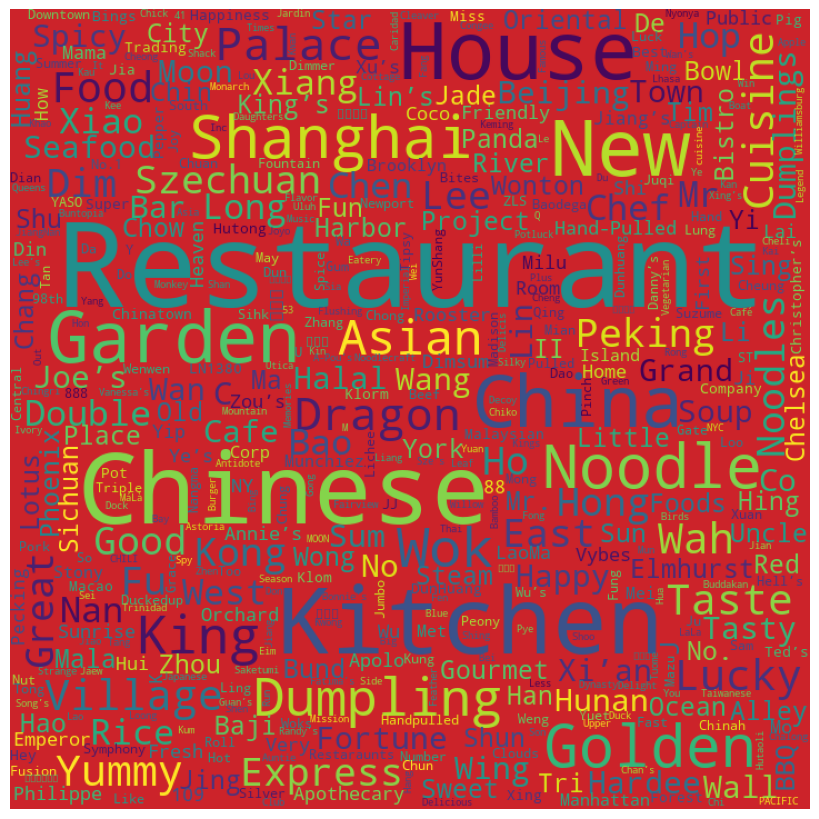

In [53]:
wordcloud=WordCloud(width=720, height=720, margin=0,background_color='#cc232a',
max_words = len(word_count_df['word'])).generate_from_frequencies(dict(zip(word_count_df['word'],
word_count_df['count'])))

plt.figure(figsize=(12,8))
plt.imshow(wordcloud)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout(pad=0)


plt.savefig("word_cloud1.png", dpi=300)



In [54]:
word_count_df['rank'] = word_count_df['count'].rank(ascending=False)

In [55]:
word_count_df['rank'] = word_count_df['rank'].astype(int)

In [56]:
word_count_df.sort_values(by='count', ascending=False)

,index,word,count,percent_of_words,percent_of_restaurants,category,rank
0,0,Restaurant,54,0.055215,0.146341,places,1
1,1,Chinese,35,0.035787,0.094851,other,2
2,2,Kitchen,31,0.031697,0.084011,places,3
3,3,House,23,0.023517,0.062331,places,4
4,4,New,22,0.022495,0.059621,other,5
...,...,...,...,...,...,...,...
244,254,Pulled,1,0.001022,0.002710,other,302
243,253,Da,1,0.001022,0.002710,other,302
242,252,蜀湘门第,1,0.001022,0.002710,other,302
241,251,Pork,1,0.001022,0.002710,other,302


### Circular Lollipop Plot

In [57]:
import random

In [58]:
COUNTS = word_count_df['count']

In [59]:
COUNTS = COUNTS.to_list()

In [60]:
random.seed(23)
random.shuffle(COUNTS)

In [61]:
COUNT_MIN = np.min(COUNTS)
COUNT_MAX = np.max(COUNTS)

In [62]:
len(COUNTS)

470

In [63]:
# low and high refer to the final dot size in the lolipop
def scale_to_interval(x, low=1, high=80):
    return ((x -COUNT_MIN ) / (COUNT_MAX - COUNT_MIN)) * (high - low) + low

### Basic Circular Plot

In [64]:
# Different shades of grey used in the plot
GREY88 = "#e0e0e0"
GREY85 = "#d9d9d9"
GREY82 = "#d1d1d1"
GREY79 = "#c9c9c9"
GREY97 = "#f7f7f7"
GREY60 = "#999999"

In [65]:
# values for the x axis
ANGLES = np.linspace(0, 2 * np.pi, len(COUNTS), endpoint=False)

#heights of the lines and y-position of the dot are given by the word count
HEIGHTS = np.array(COUNTS)

#category values for the colors
CATEGORY_CODES = pd.Categorical(word_count_df['category']).codes

In [66]:
word_count_df.category.value_counts()

other             362
family name        30
food               23
places             17
royalty            11
tastes             10
animals             6
province            4
direction           4
precious metal      3
Name: category, dtype: int64

In [67]:
CATEGORY_CODES

array([5, 4, 5, 5, 4, 5, 4, 3, 6, 7, 4, 8, 4, 4, 8, 0, 3, 4, 9, 3, 4, 9,
       5, 8, 4, 4, 3, 4, 4, 2, 4, 4, 1, 9, 4, 4, 4, 4, 3, 4, 4, 4, 4, 2,
       4, 4, 1, 3, 2, 9, 4, 4, 7, 4, 4, 4, 8, 5, 2, 4, 4, 7, 4, 9, 5, 4,
       4, 3, 4, 4, 4, 8, 3, 4, 4, 6, 4, 4, 2, 4, 4, 4, 4, 0, 3, 4, 4, 4,
       2, 5, 4, 2, 4, 4, 4, 4, 4, 4, 4, 4, 9, 5, 4, 4, 4, 3, 2, 4, 4, 8,
       4, 4, 4, 4, 4, 5, 4, 4, 4, 4, 4, 2, 4, 4, 2, 4, 0, 4, 2, 4, 4, 5,
       4, 7, 4, 4, 4, 4, 4, 9, 4, 0, 4, 2, 4, 8, 4, 4, 4, 4, 2, 4, 2, 4,
       2, 4, 4, 4, 4, 5, 4, 4, 4, 4, 5, 4, 4, 4, 4, 4, 5, 5, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 2, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 0, 5,
       4, 4, 4, 4, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 3, 4, 4, 4, 4, 4,
       3, 4, 9, 2, 4, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 2, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 4, 6, 4,
       4, 4, 4, 4, 1, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 1,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,

In [68]:
# Colormap taken from https://carto.com/carto-colors/
COLORMAP = ["#7F3C8D","#11A579","#3969AC","#F2B701","#E73F74","#80BA5A","#E68310","#008695","#CF1C90","#f97b72"]

In [69]:
# Select colors for each word according to its category.
COLORS = np.array(COLORMAP)[CATEGORY_CODES]

In [70]:
# This is going to be helpful to create some space for labels within the circle 
PLUS = 1.5

In [71]:
word_count_df.sort_values(by='count', ascending=False).head(8)

,index,word,count,percent_of_words,percent_of_restaurants,category,rank
0,0,Restaurant,54,0.055215,0.146341,places,1
1,1,Chinese,35,0.035787,0.094851,other,2
2,2,Kitchen,31,0.031697,0.084011,places,3
3,3,House,23,0.023517,0.062331,places,4
4,4,New,22,0.022495,0.059621,other,5
5,5,Garden,18,0.018405,0.048780,places,6
6,6,China,18,0.018405,0.048780,other,6
7,7,Noodle,13,0.013292,0.035230,food,8


In [72]:
pd.DataFrame(COUNTS).sort_values(by=0, ascending=False).head(7)

,0
93,54
216,35
284,31
4,23
179,22
352,18
36,18


In [73]:
# Create a data frame with the information for the four words that are going to be labeled
LABELS_DF = word_count_df[word_count_df['count'] >= 18].reset_index()

#create labels
LABELS_DF['label'] = [
    f"{word}\nCount: {int(count)}"
    for word, count in zip(LABELS_DF['word'], LABELS_DF['count'])
]
# set position of the labels
LABELS_DF["x"] = [83, 211, 279, 13, 174, 344, 34]
LABELS_DF["y"] = [75, 54, 45, 37, 44, 23, 30]

In [74]:
LABELS_DF

,level_0,index,word,count,percent_of_words,percent_of_restaurants,category,rank,label,x,y
0,0,0,Restaurant,54,0.055215,0.146341,places,1,Restaurant\nCount: 54,83,75
1,1,1,Chinese,35,0.035787,0.094851,other,2,Chinese\nCount: 35,211,54
2,2,2,Kitchen,31,0.031697,0.084011,places,3,Kitchen\nCount: 31,279,45
3,3,3,House,23,0.023517,0.062331,places,4,House\nCount: 23,13,37
4,4,4,New,22,0.022495,0.059621,other,5,New\nCount: 22,174,44
5,5,5,Garden,18,0.018405,0.048780,places,6,Garden\nCount: 18,344,23
6,6,6,China,18,0.018405,0.048780,other,6,China\nCount: 18,34,30


Text(0.5, 0.02, 'Visualization by Riley Livingston - A Highly Scientific Analysis of Chinese Restaurant Names in NYC')

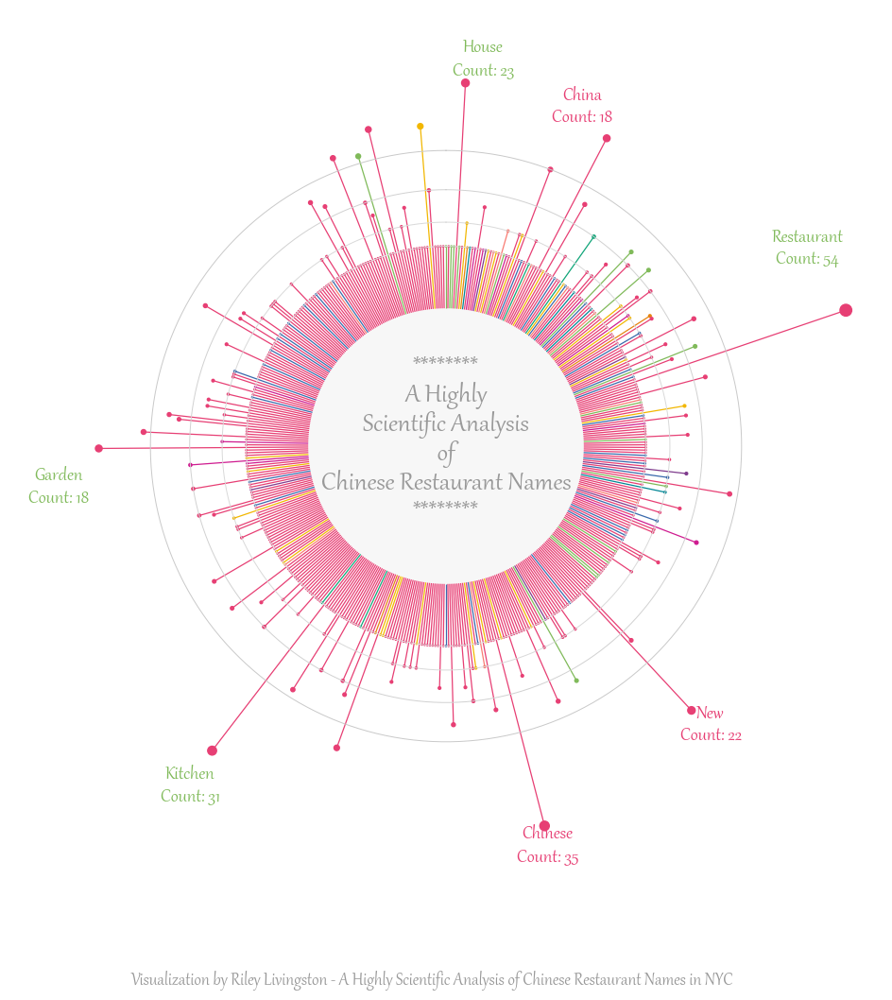

In [75]:
#initialize the layout in polar coordinates
fig, ax = plt.subplots(figsize=(12,12), subplot_kw={"projection": "polar"})


# Set background color to white, both axis and figure.
fig.patch.set_facecolor("white")
ax.set_facecolor("white")

# Use logarithmic scale for the radial axis
ax.set_rscale('symlog')

# Angular axis starts at 90 degrees, not at 0
ax.set_theta_offset(np.pi / 2)

# Reverse the direction to go counter-clockwise.
ax.set_theta_direction(-1)

# Add lines
ax.vlines(ANGLES, 0 + PLUS, HEIGHTS + PLUS, color=COLORS, lw=0.9)

# Add dots
ax.scatter(ANGLES, HEIGHTS + PLUS, s=scale_to_interval(HEIGHTS), color=COLORS)

# remove spines for both axes
ax.spines["start"].set_color('none')
ax.spines["polar"].set_color("none")

#remove gridlines, ticks, tick labels
ax.grid(False)
ax.set_xticks([])
ax.set_yticklabels([])


# Add our custom grid lines for the radial axis.
# These lines indicate 1, 2, 4, 8 instances of the word
HANGLES = np.linspace(0, 2 * np.pi, 200)
ax.plot(HANGLES, np.repeat(1 + PLUS, 200), color= GREY88, lw=0.7)
ax.plot(HANGLES, np.repeat(2 + PLUS, 200), color= GREY85, lw=0.7)
ax.plot(HANGLES, np.repeat(4 + PLUS, 200), color= GREY82, lw=0.7)
ax.plot(HANGLES, np.repeat(8 + PLUS, 200), color= GREY79, lw=0.7)

# If you have a look at the beginning of this post, you'll see the inner circle is not white.
# This fill creates the effect of a very light grey background.
ax.fill(HANGLES, np.repeat(PLUS, 200), GREY97)

# Note the 'transform=ax.transAxes'
# It allows us to pass 'x' and 'y' in terms of the (0, 1) coordinates of the axis
# instead of having to use the coordinates of the data.
# (0.5, 0.5) represents the middle of the axis in this transformed coordinate system
ax.text(
    x=0.5, y=0.508, s="********\nA Highly\nScientific Analysis\n of \nChinese Restaurant Names\n********",
    color=GREY60, va="center", ha="center", ma="center", fontfamily="Gabriola",
    fontsize=23, fontweight="bold", linespacing=1.1, transform=ax.transAxes)


# Add labels for the five selected words
for idx, row in LABELS_DF.iterrows():
    color = COLORS[row["index"]]
    ax.text(
        x=ANGLES[row["x"]], y=row["y"], s=row["label"], color=color,
        ha="right", va="center", ma="center", size=16,
        family="Gabriola", weight="bold"
        )

fig.text(
    x=0.5, y=0.02, s="Visualization by Riley Livingston - A Highly Scientific Analysis of Chinese Restaurant Names in NYC",
    color=GREY60, fontsize=15, ha="center", fontfamily="Gabriola", fontweight="bold")


In [76]:
def circular_plot(angles, heights, colors, lw, ax):
    ax.set_facecolor("white")
    
    ax.set_rscale("symlog")
    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)
    
    ax.spines["start"].set_color("none")
    ax.spines["polar"].set_color("none")
    
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticklabels([])
    
    # The 'lw' argument controls the width of the lines. 
    # This is going to be different for the top and lower panels.
    ax.vlines(angles, 0 + PLUS, heights + PLUS, color=colors, lw=lw)
    ax.scatter(angles, heights + PLUS, s=scale_to_interval(heights), color=colors)
    
    HANGLES = np.linspace(0, 2 * np.pi, 200)
    ax.plot(HANGLES, np.repeat(1 + PLUS, 200), color= GREY88, lw=0.7)
    ax.plot(HANGLES, np.repeat(2 + PLUS, 200), color= GREY85, lw=0.7)
    ax.plot(HANGLES, np.repeat(4 + PLUS, 200), color= GREY82, lw=0.7)
    ax.plot(HANGLES, np.repeat(8 + PLUS, 200), color= GREY79, lw=0.7)

    
    ax.fill(HANGLES, np.repeat(PLUS, 200), GREY97)
    
    # Change upper limit of the radial axis so larger dots fit within the plot area
    ax.set_rmax(ax.get_rmax() * 2)
    


    

In [77]:
def map_category(category):
    """Maps Categories names to the subplots"""
    if category =='other':
        return 'Other'
    elif category == "family_name":
        return "Family\nNames"
    elif category == "place":
        return "Places"
    elif category == 'tastes':
        return 'Taste'
    elif category == "food":
        return "Food"
    elif category == "direction":
        return "Direction"
    elif category == 'precious_metal':
        return 'Precious\nMetals'
    elif category == 'royalty':
        return 'Royalty'
    elif category == 'province':
        return 'Chinese\nProvinces\n and\n Cities'
    elif category =='animal':
        return 'Animals'
    else:
        return category

In [78]:
CATEGORIES = sorted(pd.Categorical(word_count_df["category"]).unique())
LABELS = [map_category(category) for category in CATEGORIES]

In [79]:
len(COUNTS)

470

In [80]:
len(ANGLES)

470

In [81]:
len(HEIGHTS)

470

In [82]:
word_count_df = word_count_df.reset_index()

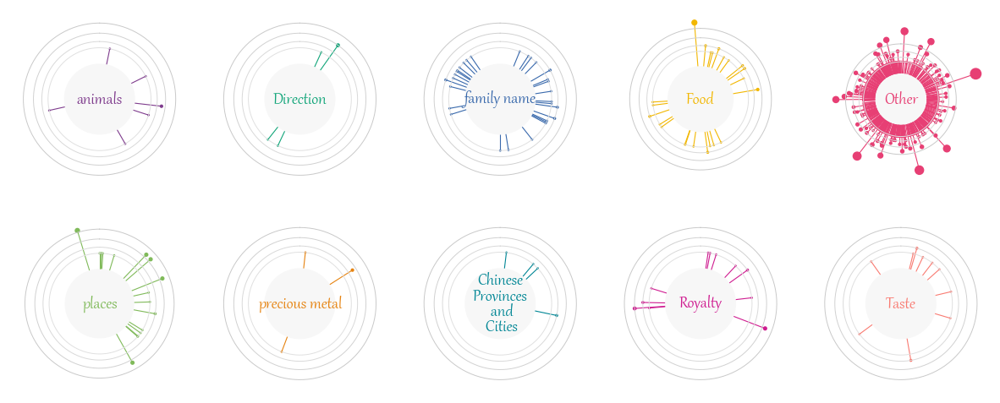

In [83]:
# The plot consists of 2 rows and 5 columns (10 categories in total)
fig, axes = plt.subplots(2, 5, figsize=(15, 6), subplot_kw={"projection": "polar"})
fig.patch.set_facecolor("white")

# Define the slices used to iterate through 'axes'.
# It iterates in a rowwise manner.
# It starts in the first row, and iterates over all the columns of that row
# from left to right, then it goes to the next row and does the same.
SLICES = [(i, j) for i in range(2) for j in range(5)]


for category, label, slice_ in zip(CATEGORIES, LABELS, SLICES):
    # Select axis
    ax = axes[slice_]

    # Select indexes corresponding to the words in this category
    idx = word_count_df.index[word_count_df["category"] == category].tolist()
    
    # Subset ANGLES, HEIGHTS, and COLORS to use the ones for this category.
    angles = ANGLES[idx]
    heights = HEIGHTS[idx]
    colors = COLORS[idx]
    
    # Create circular plot
    circular_plot(angles, heights, colors, 0.8, ax)
    
    # Add text within the inner circle representing the category
    ax.text(
        x=0.5, y=0.5, s=label, color=colors[0], va="center", ha="center",
        ma="center", fontfamily="Gabriola", fontsize=16, fontweight="bold",
        linespacing=0.87, transform=ax.transAxes

    
    )


# Adjust space between subplots.
# 'wspace=0' leaves no horizontal space between subplots.
# 'hspace=0' leaves no vertical space between subplots.
fig.subplots_adjust(wspace=0.1, hspace=0.1)

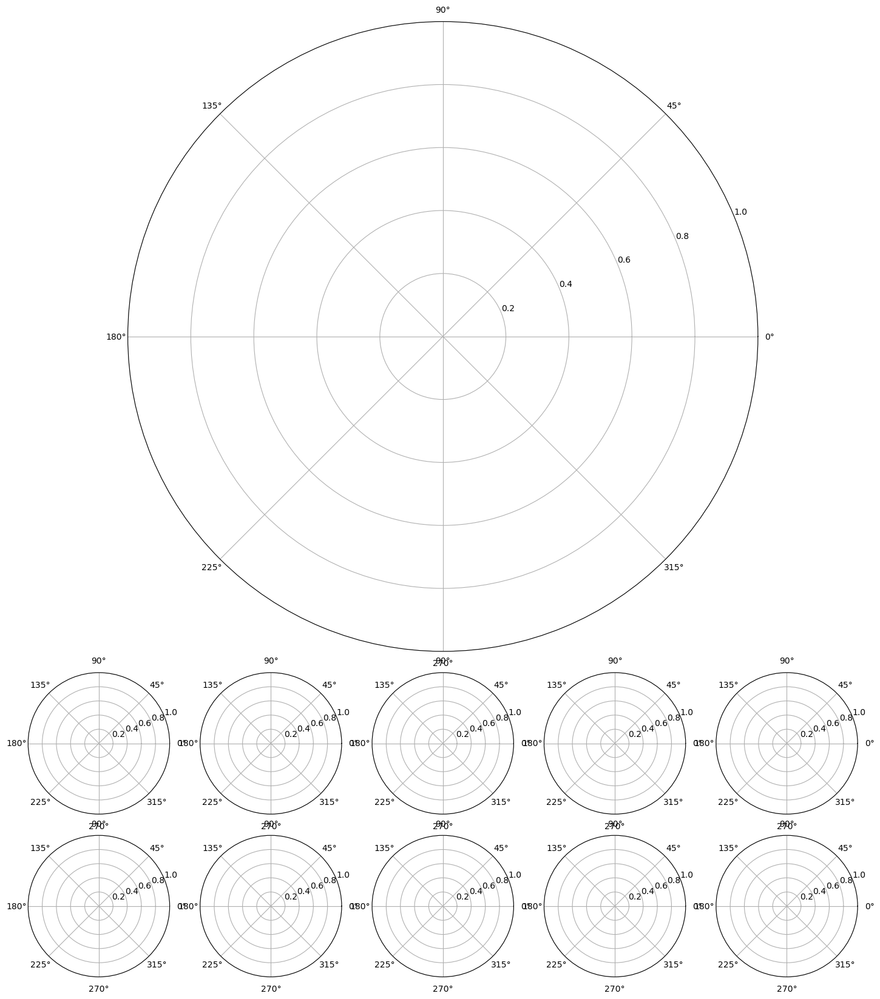

In [84]:
fig, axes = plt.subplots(nrows=6, ncols=5, figsize=(15, 17.5), subplot_kw={"projection": "polar"})
fig.patch.set_facecolor("white")
gs = axes[0, 0].get_gridspec()

# Remove the underlying axes for the subplots that are going to be combined
for i in range(4):
    for j in range(5):
        axes[i, j].remove()

# Combine subplots into one larger subplot
ax_big = fig.add_subplot(
    gs[:4, :], # takes all the subplots on the first 4 rows.
    projection="polar" # indicates this big axis uses a polar projection
)

# Set its aspect to "equal" so it is centered
ax_big.set_aspect("equal")

# Adjust margin and space between subplots
fig.subplots_adjust(
    left=0.04, bottom=0.05, right=0.96, top=0.95, # margins
    wspace=0.15, hspace=.15 # spaces

)

# Final Circular Lolipop Plot

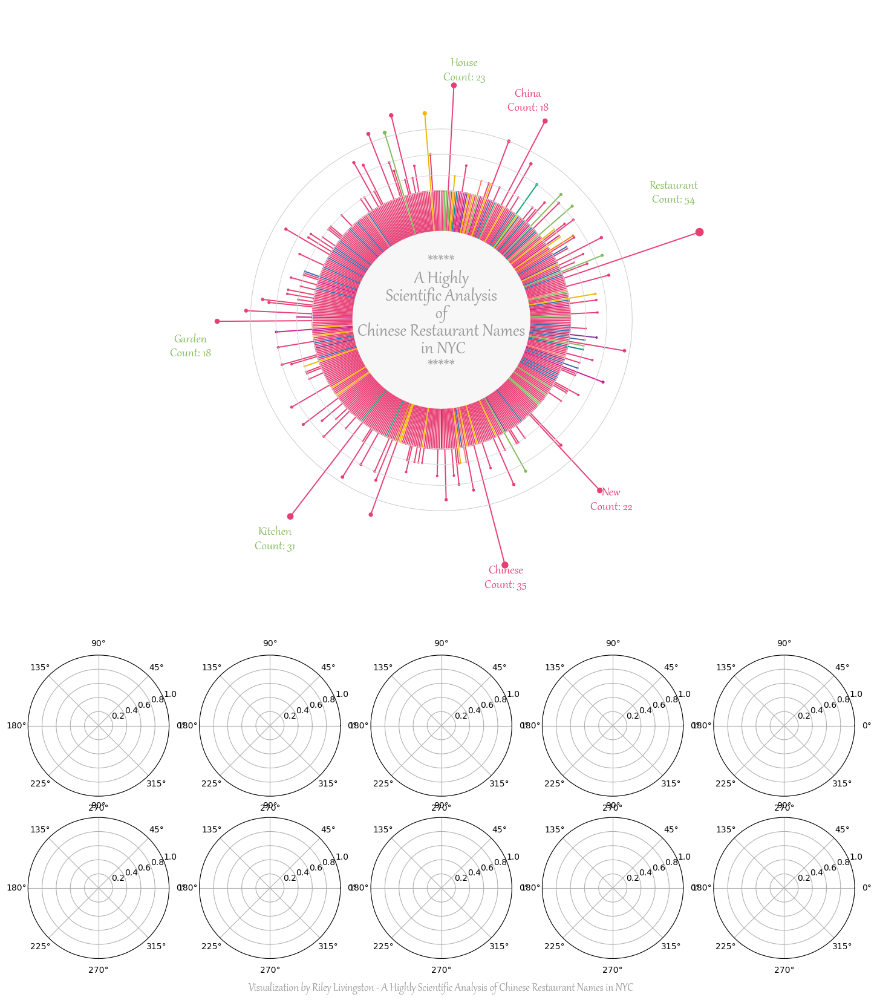

In [85]:
# Add circular plot
circular_plot(ANGLES, HEIGHTS, COLORS, 1.4, ax_big)
# Add text annotations
for idx, row in LABELS_DF.iterrows():
    color=COLORS[row["index"]]
    ax_big.text(
        ANGLES[row["x"]], row["y"], row["label"], ha="right", va="center",
        ma="center", size=17, family="Gabriola", weight="bold", color=color
    )


ax_big.text(
    x=0.5, y=0.51, s="*****\nA Highly\nScientific Analysis\n of \nChinese Restaurant Names\n in NYC\n*****",
    color=GREY60, va="center", ha="center", ma="center", fontfamily="Gabriola",
    fontsize=24, fontweight="bold", linespacing=0.95, transform=ax_big.transAxes
)
fig.text(
    x=0.5, y=0.02, s="Visualization by Riley Livingston - A Highly Scientific Analysis of Chinese Restaurant Names in NYC",
    color=GREY60, fontsize=15, ha="center", fontfamily="Gabriola", fontweight="bold")
fig

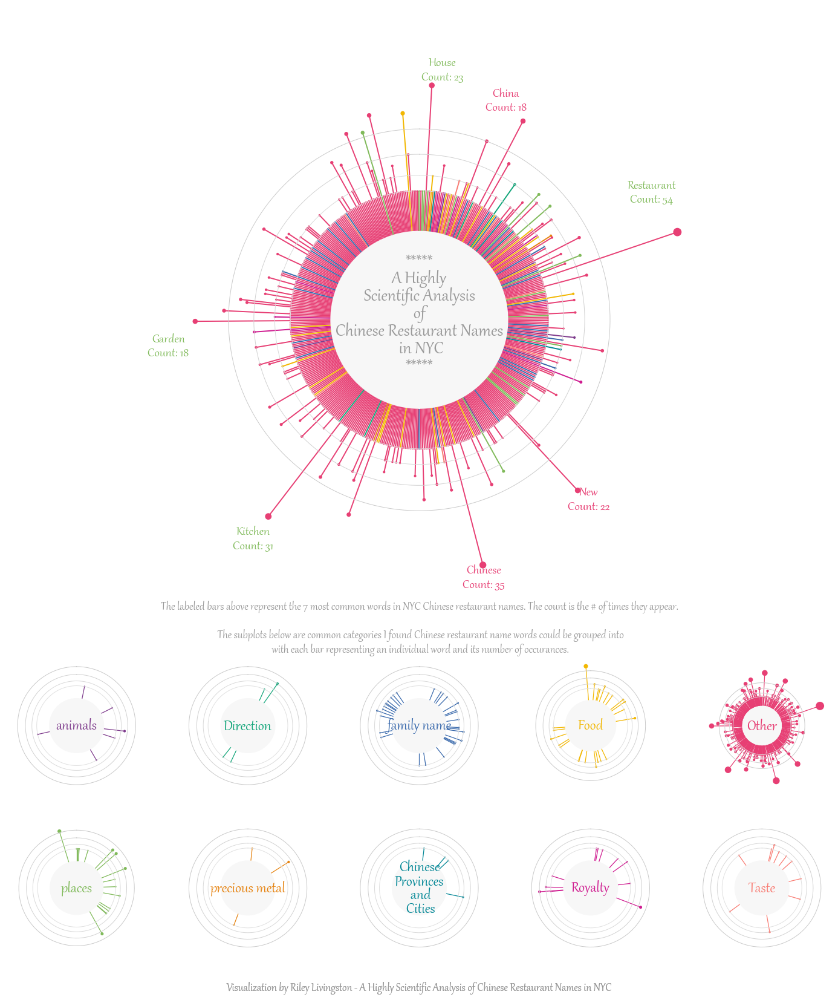

In [86]:
# Note these have changed because we iterate on rows 
# 4 and 5 (fifth and sixth, respectively)
slices = [(i + 4, j) for i in range(2) for j in range(5)]

for category, label, idx_ax in zip(CATEGORIES, LABELS, slices):
    ax = axes[idx_ax]
    idx = word_count_df.index[word_count_df["category"] == category].tolist()
    
    angles = ANGLES[idx]
    heights = HEIGHTS[idx]
    colors = COLORS[idx]
    
    circular_plot(angles, heights, colors, 0.9, ax)
    
    ax.text(
        x=0.5, y=0.5, s=label, color=colors[0], va="center", ha="center",
        ma="center", fontfamily="Gabriola", fontsize=20, fontweight="bold",
        linespacing=0.87, transform=ax.transAxes
    )
fig.text(
    x=0.5, y=0.339, s="The labeled bars above represent the 7 most common words in NYC Chinese restaurant names. The count is the # of times they appear.\n\n The subplots below are common categories I found Chinese restaurant name words could be grouped into\n with each bar representing an individual word and its number of occurances.",
    color=GREY60, fontsize=15, ha="center", fontfamily="Gabriola", fontweight="bold")

fig.text(
    x=0.5, y=0.02, s="Visualization by Riley Livingston - A Highly Scientific Analysis of Chinese Restaurant Names in NYC",
    color=GREY60, fontsize=15, ha="center", fontfamily="Gabriola", fontweight="bold"
)

fig.savefig("circular_lollipop.png", dpi=300)
fig

### Donut Chart

In [87]:
common_word_list = ['Restaurant', 'Kitchen',  'Chinese', 'China', 'House']

In [88]:
restaurant_kitchen = word_count_df[word_count_df['word'].isin(common_word_list)]


In [89]:
temp_df = pd.DataFrame({'index': [9],
                        'word': ['Other'],
                        'percent_of_restaurants': [1-(0.088372 + .079070 + .060465 + .060465+  .041860 +  .004651)],
                        'category': ['other']})

In [90]:
temp_df

,index,word,percent_of_restaurants,category
0,9,Other,0.665117,other


In [91]:
restaurant_kitchen = restaurant_kitchen.append(temp_df, ignore_index=True)

C:\Users\riley\AppData\Local\Temp\ipykernel_26684\1571482830.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  restaurant_kitchen = restaurant_kitchen.append(temp_df, ignore_index=True)


In [92]:
word_count_df.sort_values(by='count', ascending=False).head(8)

,level_0,index,word,count,percent_of_words,percent_of_restaurants,category,rank
0,0,0,Restaurant,54,0.055215,0.146341,places,1
1,1,1,Chinese,35,0.035787,0.094851,other,2
2,2,2,Kitchen,31,0.031697,0.084011,places,3
3,3,3,House,23,0.023517,0.062331,places,4
4,4,4,New,22,0.022495,0.059621,other,5
5,5,5,Garden,18,0.018405,0.048780,places,6
6,6,6,China,18,0.018405,0.048780,other,6
7,7,7,Noodle,13,0.013292,0.035230,food,8


In [93]:
restaurant_kitchen=restaurant_kitchen.sort_values(by='percent_of_restaurants', ascending=False)

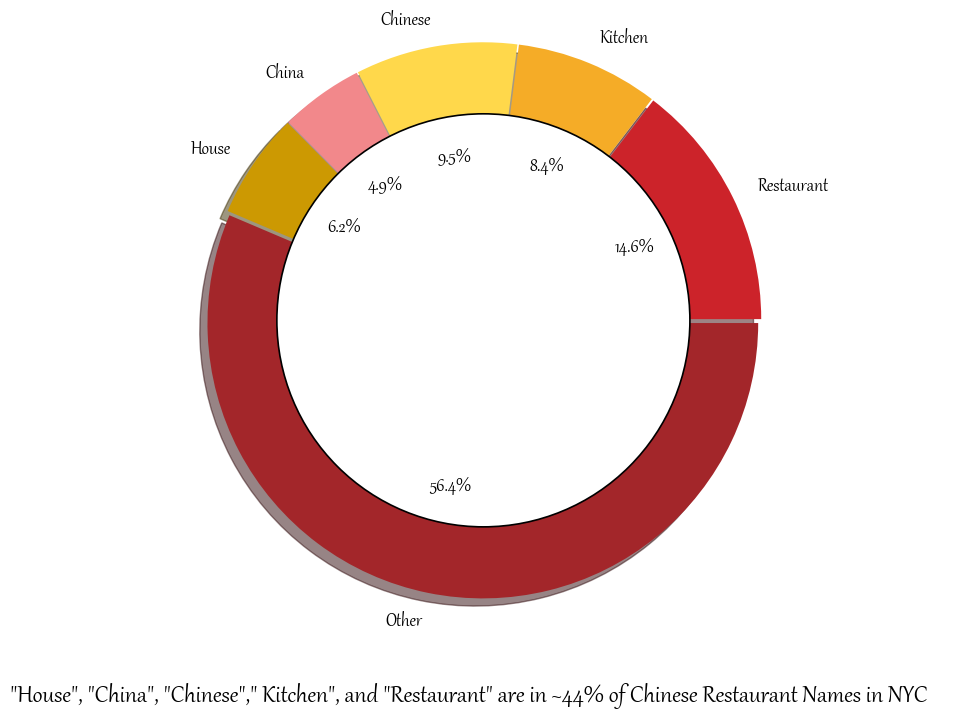

In [94]:

import matplotlib.pyplot as plt

plt.figure(figsize=(12,8))
plt.rcParams.update({'font.size': 15})

plt.rcParams["font.family"] = 'Gabriola'



# The slices will be ordered and plotted counter-clockwise.
labels = 'Restaurant', 'Kitchen',  'Chinese', 'China', 'House', 'Other'
sizes = [14.6, 8.4, 9.5, 4.9, 6.2, 56.4]
colors = ["#cc232a", "#f5ac27", "#ffd84b", "#f2888b", "#cc9902", "#a3262a"]
explode = (0.01, 0.01, 0.01, 0.01, 0.01, 0.01)  # explode a slice if required

plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True)
        
#draw a circle at the center of pie to make it look like a donut
centre_circle = plt.Circle((0,0),0.75,color='black', fc='white',linewidth=1.2)
fig = plt.gcf()
fig.gca().add_artist(centre_circle)



# Set aspect ratio to be equal so that pie is drawn as a circle.
plt.axis('equal') 
fig.text(x=0.5, y=0.02, s='"House", "China", "Chinese"," Kitchen", and "Restaurant" are in ~44% of Chinese Restaurant Names in NYC',
    color='black', fontsize=20, ha="center", fontfamily="Gabriola", fontweight="bold")

fig.savefig("donut.png", dpi=300)

### Choropleth Map

In [95]:
china_provinces_df1 = word_count_df[word_count_df['word'].isin(['Hunan', 'Shanghai', "Sichuan", 'Beijing'])]

In [96]:
china_provinces_df1

,level_0,index,word,count,percent_of_words,percent_of_restaurants,category,rank
9,9,9,Shanghai,12,0.012270,0.03252,province,9
52,52,57,Beijing,3,0.003067,0.00813,province,62
61,61,66,Hunan,3,0.003067,0.00813,province,62
133,133,141,Sichuan,2,0.002045,0.00542,province,105


In [97]:
import json

In [98]:
chinese_provinces = json.load(open("C:\\Users\\riley\\OneDrive\\Desktop\\Data Portfolio Project\\a_highly_scientific_analysis_of_chinese_restaurant_names\\gadm36_CHN_1.json"))

In [99]:
chinese_provinces

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'geometry': {'type': 'Polygon',
    'coordinates': [[[116.12962341, 29.82485008],
      [116.05905914, 30.20925522],
      [115.76095581, 30.67427635],
      [116.0011673, 30.9495163],
      [115.87502289, 31.14422417],
      [115.55741119, 31.15970039],
      [115.36437225, 31.40503883],
      [115.49180603, 31.67566681],
      [115.90435791, 31.82001877],
      [115.93076324, 32.16601944],
      [115.82931519, 32.52696991],
      [115.61597443, 32.41099548],
      [115.19152832, 32.5904808],
      [115.13391113, 32.89952469],
      [115.28569031, 33.13598633],
      [115.40752411, 33.55921555],
      [115.63195038, 33.58683777],
      [115.54928589, 33.89166641],
      [115.7220459, 34.08029938],
      [116.14985657, 33.71124649],
      [116.63354492, 33.98846436],
      [116.51093292, 34.29732513],
      [116.17365265, 34.43161392],
      [116.18591309, 34.57946777],
      [116.36860657, 34.64086914],
      [116.8230

In [100]:
chinese_provinces['features'][0].keys()

dict_keys(['type', 'geometry', 'properties'])

In [101]:
chinese_provinces

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'geometry': {'type': 'Polygon',
    'coordinates': [[[116.12962341, 29.82485008],
      [116.05905914, 30.20925522],
      [115.76095581, 30.67427635],
      [116.0011673, 30.9495163],
      [115.87502289, 31.14422417],
      [115.55741119, 31.15970039],
      [115.36437225, 31.40503883],
      [115.49180603, 31.67566681],
      [115.90435791, 31.82001877],
      [115.93076324, 32.16601944],
      [115.82931519, 32.52696991],
      [115.61597443, 32.41099548],
      [115.19152832, 32.5904808],
      [115.13391113, 32.89952469],
      [115.28569031, 33.13598633],
      [115.40752411, 33.55921555],
      [115.63195038, 33.58683777],
      [115.54928589, 33.89166641],
      [115.7220459, 34.08029938],
      [116.14985657, 33.71124649],
      [116.63354492, 33.98846436],
      [116.51093292, 34.29732513],
      [116.17365265, 34.43161392],
      [116.18591309, 34.57946777],
      [116.36860657, 34.64086914],
      [116.8230

In [102]:
chinese_provinces['features'][0]['properties']

{'GID_0': 'CHN',
 'NAME_0': 'China',
 'GID_1': 'CHN.1_1',
 'NAME_1': 'Anhui',
 'VARNAME_1': 'Ānhuī',
 'NL_NAME_1': '安徽|安徽',
 'TYPE_1': 'Shěng',
 'ENGTYPE_1': 'Province',
 'CC_1': '',
 'HASC_1': 'CN.AH'}

In [103]:
province_id_map = {}
for feature in chinese_provinces['features']:
    feature['id'] = feature['properties']['NAME_1']
    province_id_map[feature['properties']['NAME_1']] =feature['id']

In [104]:
province_id_map

{'Anhui': 'Anhui',
 'Beijing': 'Beijing',
 'Chongqing': 'Chongqing',
 'Fujian': 'Fujian',
 'Gansu': 'Gansu',
 'Guangdong': 'Guangdong',
 'Guangxi': 'Guangxi',
 'Guizhou': 'Guizhou',
 'Hainan': 'Hainan',
 'Hebei': 'Hebei',
 'Heilongjiang': 'Heilongjiang',
 'Henan': 'Henan',
 'Hubei': 'Hubei',
 'Hunan': 'Hunan',
 'Jiangsu': 'Jiangsu',
 'Jiangxi': 'Jiangxi',
 'Jilin': 'Jilin',
 'Liaoning': 'Liaoning',
 'Nei Mongol': 'Nei Mongol',
 'Ningxia Hui': 'Ningxia Hui',
 'Qinghai': 'Qinghai',
 'Shaanxi': 'Shaanxi',
 'Shandong': 'Shandong',
 'Shanghai': 'Shanghai',
 'Shanxi': 'Shanxi',
 'Sichuan': 'Sichuan',
 'Tianjin': 'Tianjin',
 'Xinjiang Uygur': 'Xinjiang Uygur',
 'Xizang': 'Xizang',
 'Yunnan': 'Yunnan',
 'Zhejiang': 'Zhejiang'}

In [105]:
china_provinces_df1['id'] = china_provinces_df1['word'].apply(lambda x:province_id_map[x])

C:\Users\riley\AppData\Local\Temp\ipykernel_26684\1203971792.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  china_provinces_df1['id'] = china_provinces_df1['word'].apply(lambda x:province_id_map[x])


In [106]:
china_provinces_df1

,level_0,index,word,count,percent_of_words,percent_of_restaurants,category,rank,id
9,9,9,Shanghai,12,0.012270,0.03252,province,9,Shanghai
52,52,57,Beijing,3,0.003067,0.00813,province,62,Beijing
61,61,66,Hunan,3,0.003067,0.00813,province,62,Hunan
133,133,141,Sichuan,2,0.002045,0.00542,province,105,Sichuan


In [107]:
chinese_provinces_df = pd.DataFrame(chinese_provinces_list, columns=['id'])

In [108]:
china_provinces_df1= pd.merge(chinese_provinces_df, china_provinces_df1, on='id', how='left')

In [109]:
china_provinces_df1['word'] = china_provinces_df1['id']

In [110]:
china_provinces_df1 = china_provinces_df1.fillna(0)

In [111]:
import plotly.express as px
import plotly.io as pio

In [112]:
choropleth_df = df_unique[df_unique['restaurant_names'].str.contains('|'.join(chinese_provinces_list), regex=True)]

In [113]:
pio.renderers.default = ('browser')

In [114]:
fig = px.choropleth(china_provinces_df1, 
                        locations= 'word', 
                        fitbounds='locations',
                        geojson=chinese_provinces, color='count', 
                        hover_data=['count'],
                        color_continuous_scale = px.colors.sequential.OrRd,

                        
                        )
fig.update_layout(title='Provinces in NYC Chinese Restaurant Names', font_family='Gabriola', font_size=16.5)
fig.update_layout(title={
        'text': "Provinces in NYC Chinese Restaurant Names",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
                  
fig.update_geos(fitbounds='locations', visible=False)


fig.update_layout(coloraxis_colorbar=dict(
    thicknessmode="pixels", thickness=7,
    lenmode="pixels", len=110,
    yanchor="top", y=0.75,
    ticks="outside",
    dtick=12, 
    title='Count')
)
fig.add_annotation(text="12.5%, of China's provinces are featured in the names of Chinese restaurants.", x=0.5, y=0.0, font_size = 20, showarrow=False)
fig.show()
fig.write_html("plotly_choropleth.html")


In [115]:
df_unique.shape

(369, 1)

### Barplots

In [116]:
word_count_df['category'].value_counts()


other             362
family name        30
food               23
places             17
royalty            11
tastes             10
animals             6
province            4
direction           4
precious metal      3
Name: category, dtype: int64

C:\Users\riley\AppData\Local\Temp\ipykernel_26684\29057756.py:11: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\riley\AppData\Local\Temp\ipykernel_26684\29057756.py:22: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\riley\AppData\Local\Temp\ipykernel_26684\29057756.py:32: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\riley\AppData\Local\Temp\ipykernel_26684\29057756.py:44: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\riley\AppData\Local\Temp\ipykernel_26684\29057756.py:55: UserWarning:

FixedFormatter should only be used together with FixedLocator

C:\Users\riley\AppData\Local\Temp\ipykernel_26684\29057756.py:65: UserWarning:

FixedFormatter should only be used together with FixedLocator



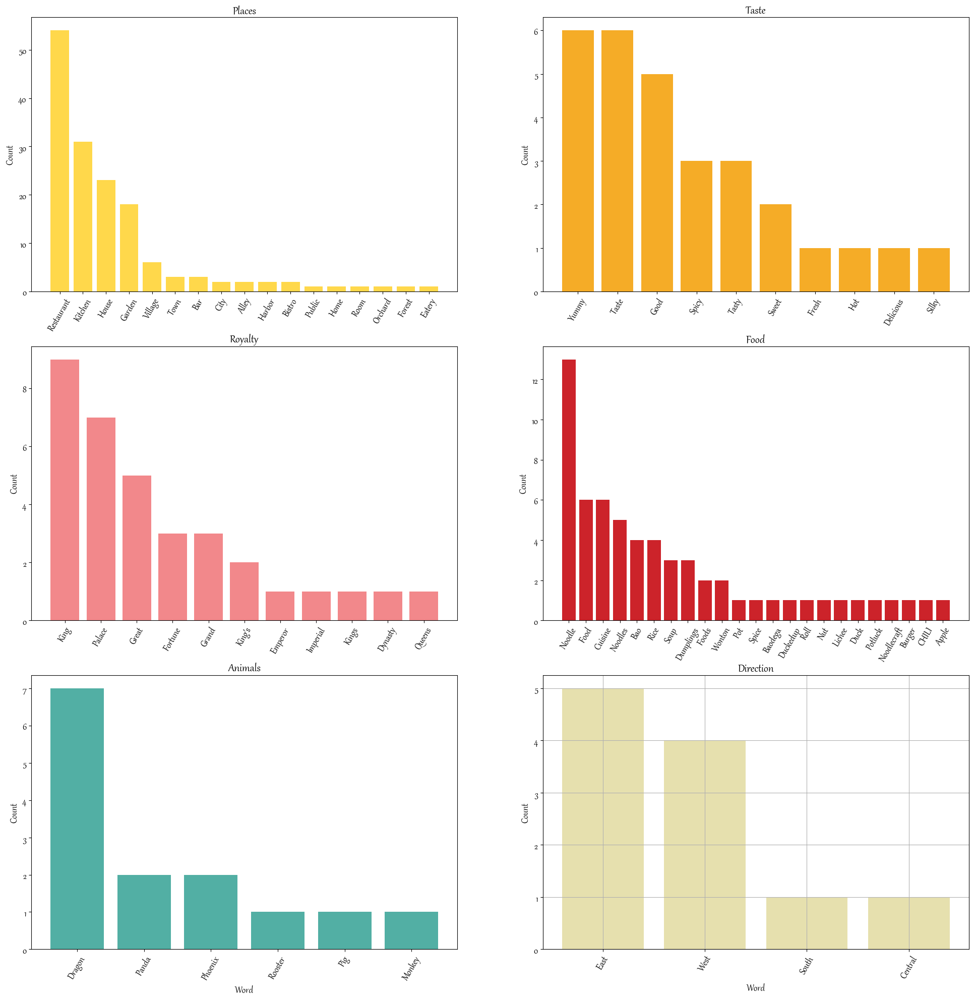

In [117]:
fig, ax = plt.subplots(nrows=3, ncols=2,figsize=(24,24))

plt.grid()
# plot data for place
mask = word_count_df['category'] =='places'
df_places = word_count_df[mask]
ax[0, 0].bar(df_places['word'],df_places['count'], color="#FFD84B")
ax[0, 0].set_title('Places')
ax[0, 0].set_xlabel("")
ax[0, 0].set_ylabel('Count')
ax[0, 0].set_xticklabels(df_places['word'], rotation=60)


# plot data for taste

mask2 = word_count_df['category'] =='tastes'
df_taste = word_count_df[mask2]
ax[0, 1].bar(df_taste['word'],df_taste['count'], color="#F5AC27")
ax[0, 1].set_title('Taste')
ax[0, 1].set_xlabel("")
ax[0, 1].set_ylabel('Count')
ax[0, 1].set_xticklabels(df_taste['word'], rotation=60)

#plot the data for royalty

mask3 = word_count_df['category'] =='royalty'
df_royalty = word_count_df[mask3]
ax[1, 0].bar(df_royalty['word'],df_royalty['count'], color="#F2888B")
ax[1, 0].set_title('Royalty')
ax[1, 0].set_xlabel("")
ax[1, 0].set_ylabel('Count')
ax[1, 0].set_xticklabels(df_royalty['word'], rotation=60)



#plot the data for food

mask4 = word_count_df['category'] == 'food'
df_food = word_count_df[mask4]
ax[1, 1].bar(df_food['word'],df_food['count'], color="#CC232A")
ax[1, 1].set_title('Food')
ax[1, 1].set_xlabel("")
ax[1, 1].set_ylabel('Count')
ax[1, 1].set_xticklabels(df_food['word'], rotation=60)


#plot the data for animals

mask5 = word_count_df['category'] == 'animals'
df_food = word_count_df[mask5]
ax[2, 0].bar(df_food['word'],df_food['count'], color="#52AFA4")
ax[2, 0].set_title('Animals')
ax[2, 0].set_xlabel('Word')
ax[2, 0].set_ylabel('Count')
ax[2, 0].set_xticklabels(df_food['word'], rotation=60)


#plot the data for 
mask6 = word_count_df['category'] == 'direction'
df_food = word_count_df[mask6]
ax[2, 1].bar(df_food['word'],df_food['count'], color="#e6e0ae")
ax[2, 1].set_title('Direction')
ax[2, 1].set_xlabel('Word')
ax[2, 1].set_ylabel('Count')
ax[2, 1].set_xticklabels(df_food['word'], rotation=60)

plt.show()


In [118]:
temp_category_list = ['places', 'tastes', 'royalty', 'precious metal', 'food', 'animals', 'direction']

In [119]:
px_categories = word_count_df[word_count_df['category'].isin(temp_category_list)]

In [120]:
fig = px.bar(px_categories, 
             x='count', 
             y='word', 
             title='Describing Taste', 
             color='category', color_discrete_map={'places': '#A3262A', 
                                                   'food': '#F2888B', 
                                                   'tastes': '#F5AC27', 
                                                   'animals': '#FFD84B' , 
                                                   'royalty': '#4c8c4c', 
                                                   'precious metal': '#a1aaa8', 
                                                   'direction': '#97c1df'
                                                     })
fig.update_layout(title='Word themes in NYC Chinese Restaurant Names', font_family='Gabriola', font_size=14)
fig.update_layout(title={
        'text': "Word Themes in NYC Chinese Restaurant Names",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.show()
fig.write_html("plotly_bar.html")


### Sunburst Chart

In [121]:
word_count_df_filt = word_count_df[word_count_df['category']=='family name']

In [122]:
word_count_df_filt = word_count_df[word_count_df['category'].isin(temp_category_list)]

In [123]:
word_count_df_filt = word_count_df[word_count_df['category']=='family name']

In [124]:
word_count_df_filt

,level_0,index,word,count,percent_of_words,percent_of_restaurants,category,rank
29,29,34,Hong,5,0.005112,0.01355,family name,30
43,43,48,Chen,4,0.004090,0.01084,family name,42
48,48,53,Wang,3,0.003067,0.00813,family name,62
58,58,63,Lin,3,0.003067,0.00813,family name,62
78,78,83,Ma,2,0.002045,0.00542,family name,105
88,88,93,Li,2,0.002045,0.00542,family name,105
91,91,96,Zhou,2,0.002045,0.00542,family name,105
106,106,112,Han,2,0.002045,0.00542,family name,105
121,121,129,Sun,2,0.002045,0.00542,family name,105
124,124,132,Chang,2,0.002045,0.00542,family name,105


In [125]:
fig = px.sunburst(
    word_count_df_filt, 
    path=['category', 'word'],
    values='count',
    color='count', 
    color_continuous_scale= 'Burgyl',
hover_data=['count'])

fig.update_layout(title='Word themes in NYC Chinese Restaurant Names', font_family='Gabriola', font_size=14)
fig.update_layout(title=('Family Names in NYC Chinese Restaurants'))
fig.update_layout(title={
        'text': 'Family Names in NYC Chinese Restaurant Names',
        'y':0.97,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

fig.update_layout(coloraxis_colorbar=dict(
    thicknessmode="pixels", thickness=3.5,
    lenmode="pixels", len=100,
    yanchor="top", y=0.85,
    ticks="outside",
    dtick = 6,
    title='Count'))

fig.update_traces(hovertemplate=None)


fig.show()
fig.write_html("family_name_sunburst.html")

### Restaurant Names Viz

In [126]:
temp_restaurant_names_df = df_unique[df_unique['restaurant_names'].str.contains('|'.join(chinese_provinces_list),regex=True)]
temp_restaurant_names_df

,restaurant_names
20,Grand Sichuan
21,Shanghai Zhen Gong Fu
28,Joe’s Shanghai
61,Beijing Chinese & Japanese Food
84,Memories of Shanghai
121,Beijing Dumpling House
132,Tri Dim Shanghai
148,Hunan Delight
197,Shanghai You Garden
236,M Shanghai Bistro & Garden


### Dichotomy barplots

Text(0, 0.5, 'count')

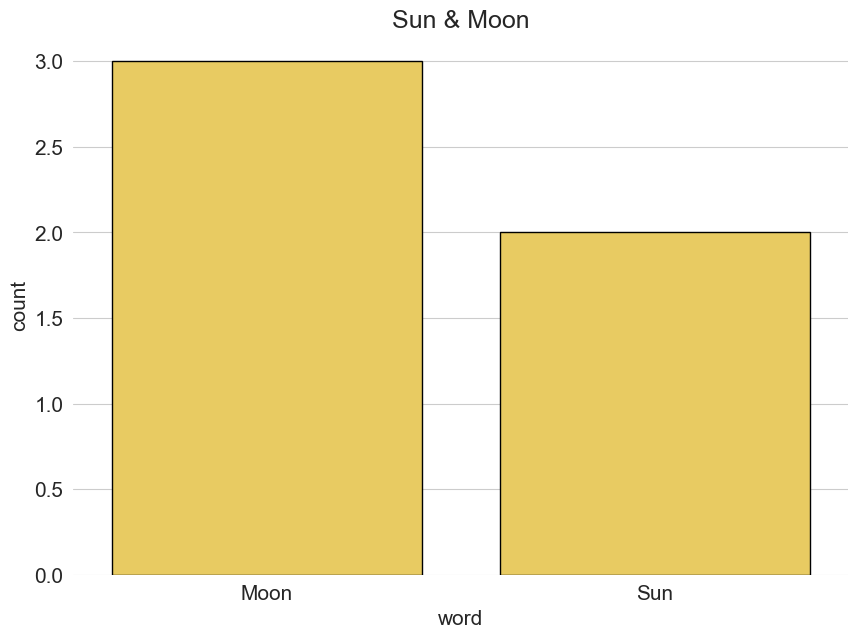

In [127]:
sun_moon_df = word_count_df[word_count_df['word'].isin(sun_moon)]
plt.figure(figsize=(10,7))
sns.set_style('whitegrid')
sns.barplot(data=sun_moon_df, x='word',y='count', color="#FFD84B", edgecolor='black')
sns.despine(left=True, bottom=True)
plt.title('Sun & Moon')
plt.xlabel('word')
plt.ylabel('count')


Text(0.5, 1.0, 'Old & New')

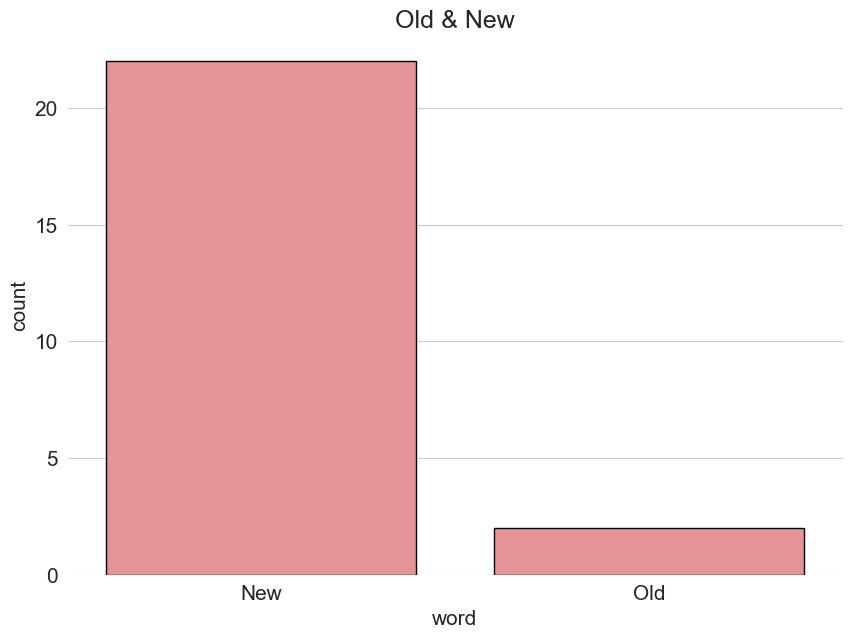

In [128]:
old_new_df = word_count_df[word_count_df['word'].isin(old_new)]
plt.rcParams['font.family'] = 'Gabriola'
plt.figure(figsize=(10,7))
sns.set_style('whitegrid')
sns.barplot(data=old_new_df, x='word',y='count', color="#F2888B", edgecolor='black')
sns.despine(left=True, bottom=True)
plt.title( 'Old & New')

In [129]:
df_unique[df_unique['restaurant_names'].str.contains('|'.join(sun_moon), regex=True)]

,restaurant_names
55,Mr. Sun
115,Moon Palace Kitchen
292,Sun Wah Restaurant
115,Spicy Moon East Village
217,New Moon
283,New Sunrise Chinese Restaurant


In [130]:
df_unique[df_unique['restaurant_names'].str.contains('|'.join(old_new), regex=True)]

,restaurant_names
38,Old Captain Dumpling
87,New Sze’s Garden
122,Jaew Hon New York
149,New Cottage
152,New Sweet Rice Kitchen
166,New Hardee Chinese Restaurant
179,New China Wok Chinese Kitchen
187,New Peking
203,New Fu Run Restaurant
238,New Golden Star


In [131]:
temp_df = word_count_df[word_count_df['word'].str.contains('|'.join(precious_metals), regex=True)]

Text(0.5, 1.0, 'Precious Metals')

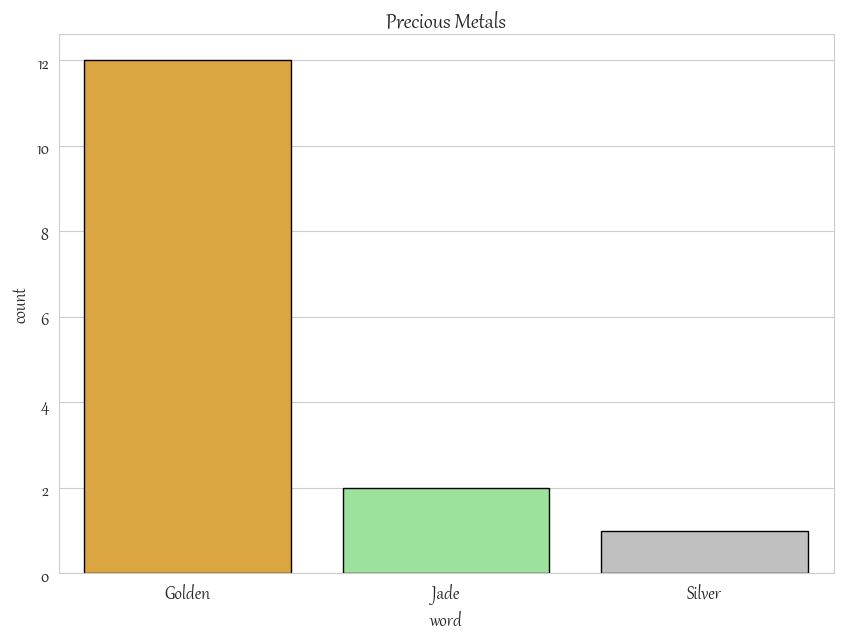

In [132]:
plt.rcParams['font.family'] = 'Gabriola'
plt.figure(figsize=(10,7))
sns.barplot(data=temp_df, x='word', y='count', palette = ["#F5AC27", "#90EE90", "silver"], edgecolor='Black')
plt.title('Precious Metals')

In [133]:
df_unique[df_unique['restaurant_names'].str.contains('|'.join(precious_metals), regex=True)]

,restaurant_names
47,Golden Harbor
76,Jade Bamboo
127,Golden Dragon Kitchen
162,Trinidad Golden Place Restaurant
191,Golden House Kitchen
238,New Golden Star
307,New Golden Dragon Restaurant
48,Golden Forest
61,Chelsea Golden Wok
69,Silver Palace


NETWORK ANALYSIS

In [134]:
import networkx as nx

In [135]:
G = nx.Graph()

In [136]:
# Add edges
for col in df_unique.columns:
    for row in df_unique[col]:
        for word1 in row.split():
            if word1.isalpha():
                for word2 in row.split():
                    if word2.isalpha() and word1 != word2:
                        G.add_edge(word1, word2)

In [137]:
for node in list(G.nodes()):
    if not node.isalpha():
        G.remove_node(node)

In [138]:
node_color_map = []
for node in G.nodes():
    if len(list(G.neighbors(node))) >= 10:
        node_color_map.append("#F5AC27")
    elif len(list(G.neighbors(node))) >= 5:
        node_color_map.append("#F2888B")
    elif len(list(G.neighbors(node))) ==1:
        node_color_map.append("silver")
    else:
        node_color_map.append("#90EE90")

In [139]:
import matplotlib.patches as mpatches

In [140]:
gold_patch = mpatches.Patch(color="#F5AC27", label='10 or more connections')
pink_patch = mpatches.Patch(color="#F2888B", label = '5-9 connections')
green_patch = mpatches.Patch(color="#90EE90", label = '2-4 connections')
silver_patch = mpatches.Patch(color="silver", label = 'Only 1 connection')


c:\Users\riley\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning:

Glyph 22812 (\N{CJK UNIFIED IDEOGRAPH-591C}) missing from current font.

c:\Users\riley\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning:

Glyph 26469 (\N{CJK UNIFIED IDEOGRAPH-6765}) missing from current font.

c:\Users\riley\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning:

Glyph 28248 (\N{CJK UNIFIED IDEOGRAPH-6E58}) missing from current font.

c:\Users\riley\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning:

Glyph 27743 (\N{CJK UNIFIED IDEOGRAPH-6C5F}) missing from current font.

c:\Users\riley\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning:

Glyph 21335 (\N{CJK UNIFIED IDEOGRAPH-5357}) missing from current font.

c:\Users\riley\anaconda3\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning:

Glyph 39135 (\N{CJK UNIFIED IDEOGRAPH-98DF}) missing from current font.

c:\Users\riley\anaconda3\lib

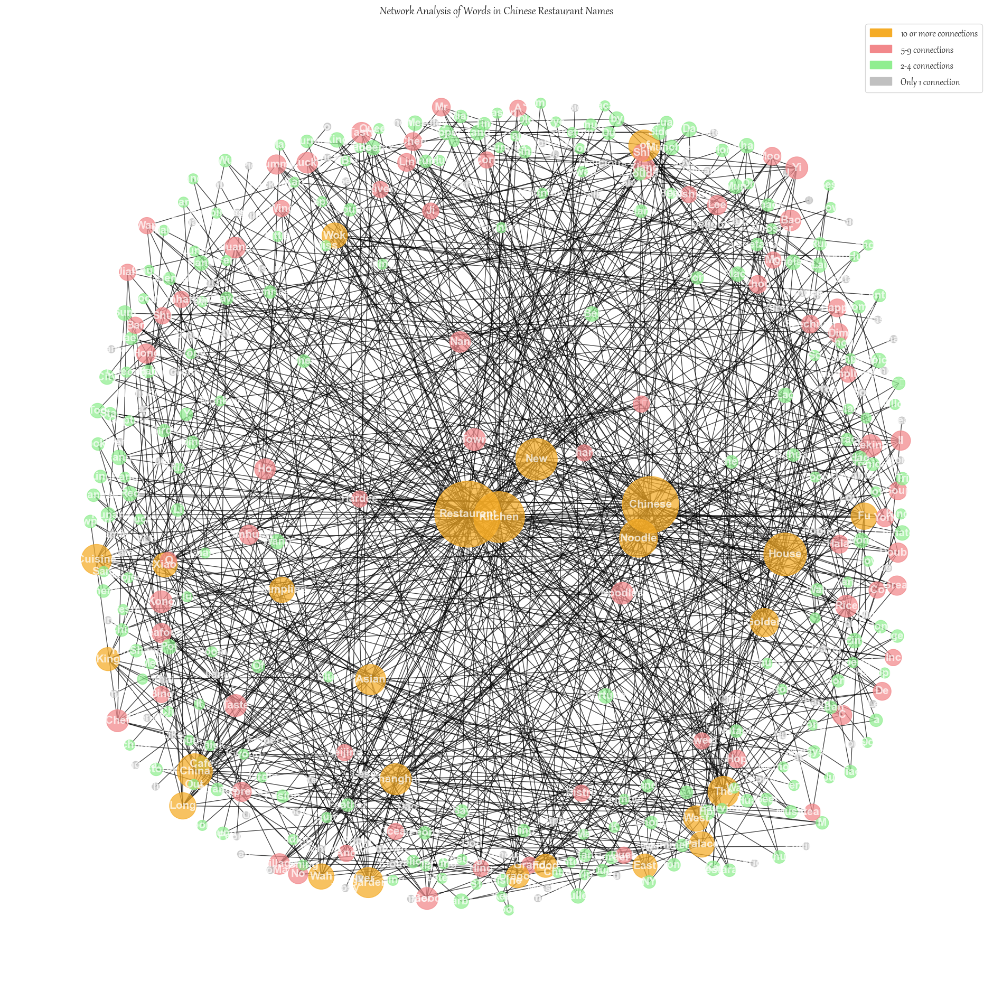

In [141]:
plt.figure(figsize=(24,24))
plt.title('Network Analysis of Words in Chinese Restaurant Names')
plt.legend(handles=[gold_patch, pink_patch, green_patch, silver_patch])
# draw the graph
pos=nx.spring_layout(G, k=0.5, iterations=50, scale=2, center=(0, 0))

nx.draw(G, with_labels=True, font_weight='bold',
        pos=nx.spring_layout(G, k=0.7, iterations=20),
        node_color =node_color_map,
        node_size=[G.degree(node)*100 for node in G],
        font_size=15,
        font_color='white',
        font_family='sans-serif',
        alpha=0.73)
        


### Network Analysis with Pyviz

In [142]:
from pyvis.network import Network

In [184]:
# create network

net = Network(height="2000px", width="100%", bgcolor="white", font_color="white", notebook=True, cdn_resources='remote')

# add nodes
for idx, node in enumerate(G.nodes()):
    net.add_node(node, color=node_color_map[idx],
                 size=G.degree(node) * 10, font_size=10, title=node, physics=True)

# add edges
for edge in G.edges():
    source, target = edge[0], edge[1]
    net.add_edge(source, target)

net.barnes_hut(gravity=-1050)
net.show_buttons(filter_=['physics'])

net.show("example.html")


example.html
